<a href="https://colab.research.google.com/github/SantiagoTangarife/HorsesVsHumans/blob/main/Img_(150_150_adadelta_2Capas_more)Redes_Horse_Human(V2.0).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Redes Neuronales**


In [206]:
import tensorflow
import tensorflow_datasets as tfds
import tensorflow as tf
import keras
import cv2
import numpy
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import image
from joblib import dump # Guardar el Modelo
from joblib import load # Cargar el Modelo



In [207]:
#from shutil import rmtree
#rmtree("grafs")

In [208]:
#RECOLECTOR DE BASURA
import gc
gc.collect()

56303

In [209]:
#descargar las imagenes de humanos y caballos
datos, metadatos=tfds.load('horses_or_humans', as_supervised=True, with_info=True)

In [210]:
metadatos

tfds.core.DatasetInfo(
    name='horses_or_humans',
    full_name='horses_or_humans/3.0.0',
    description="""
    A large set of images of horses and humans.
    """,
    homepage='http://laurencemoroney.com/horses-or-humans-dataset',
    data_path='~/tensorflow_datasets/horses_or_humans/3.0.0',
    file_format=tfrecord,
    download_size=153.59 MiB,
    dataset_size=153.53 MiB,
    features=FeaturesDict({
        'image': Image(shape=(300, 300, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=256, num_shards=1>,
        'train': <SplitInfo num_examples=1027, num_shards=2>,
    },
    citation="""@ONLINE {horses_or_humans,
    author = "Laurence Moroney",
    title = "Horses or Humans Dataset",
    month = "feb",
    year = "2019",
    url = "http://laurencemoroney.com/horses-or-humans-dataset"
    }""",
)

In [211]:
#print(metadatos.splits["train"].num_examples)
#print(metadatos.features["label"].num_classes)
#print(metadatos.splits["train"].num_examples)

In [212]:
#datos["train"]
#datos["test"]

,image,label
0,,0 (horses)
1,,0 (horses)
2,,0 (horses)
3,,0 (horses)
4,,0 (horses)

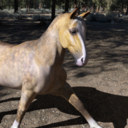
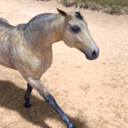
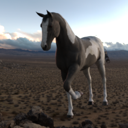
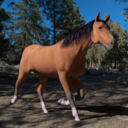
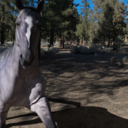

In [213]:
# ver datos 'train'= los de entrenamiento. con la etiqueta que le corresponde
tfds.as_dataframe(datos['train'].take(5),metadatos)

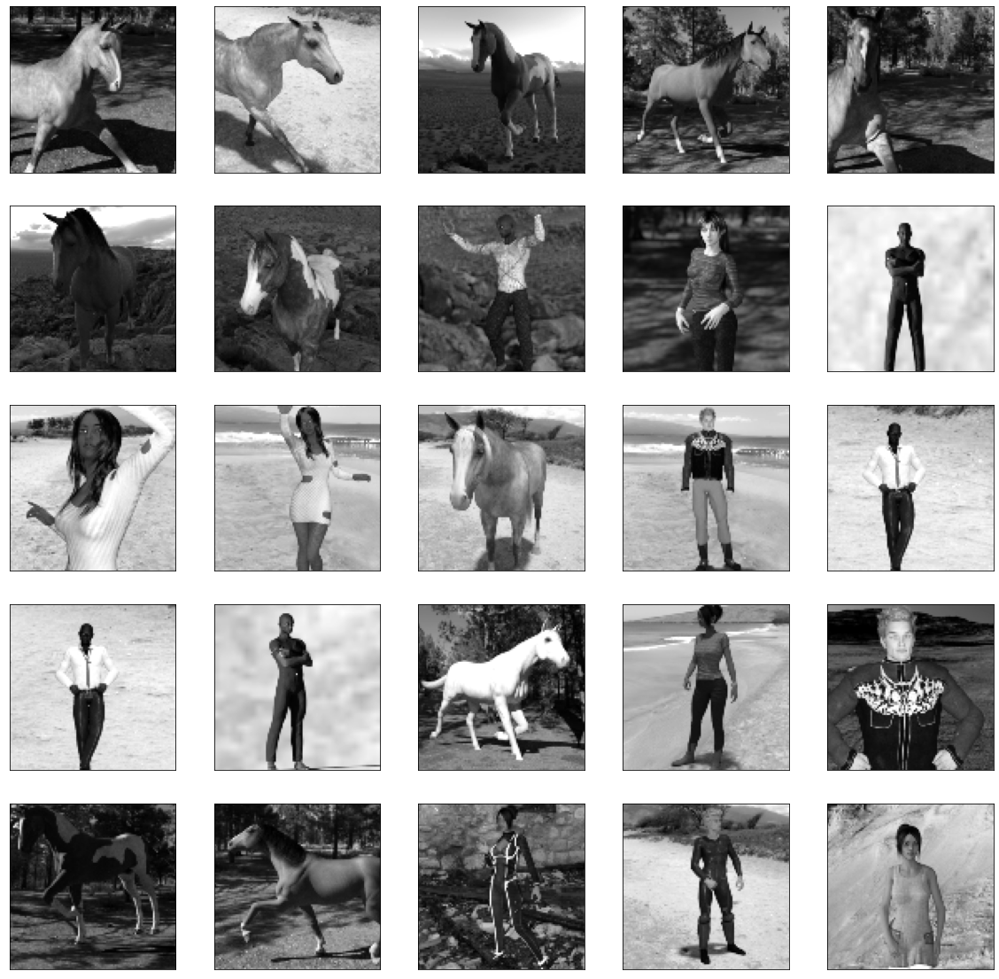

In [214]:


#para un tamaño fijo en las imagens


#establesco los tamaños mostrados
plt.figure(figsize=(20,20))
#defino el tamaño de la imagen
TAMANO_IMG=100 #EVALUO HASTA QUE LOS OJOS LOS PUEDAN IDENTIFICAR mas pequeño mejor

#itero en los datos y muestro la imagen
for i,(imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen=cv2.resize(imagen.numpy(),(TAMANO_IMG,TAMANO_IMG))
  # 25 imagenes en 5x5
  plt.subplot(5,5,i+1)
  #sin coordenadas cartesianas
  plt.xticks([])
  plt.yticks([])
  #en blanco y negro
  imagen=cv2.cvtColor(imagen,cv2.COLOR_BGR2GRAY)
  plt.imshow(imagen, cmap='gray')

In [215]:
datos_entrenamiento=[]

In [216]:
datos_test=[]

In [217]:
#santiago 
TAMANO_IMG=150
for i,(imagen, etiqueta)in enumerate(datos['train']): #SOLO LOS DE ENTRENAMIENTO
   imagen=cv2.resize(imagen.numpy(),(TAMANO_IMG,TAMANO_IMG))
   #en blanco y negro
   imagen=cv2.cvtColor(imagen,cv2.COLOR_BGR2GRAY)
   imagen=imagen.reshape(TAMANO_IMG,TAMANO_IMG,1)# FORMATO CUADRADO (150,150) EN TAMAÑO Y 1 CANAL DE COLOR(GRIS)
   #agrego las imagenes para enrenar en la lista
   datos_entrenamiento.append([imagen, etiqueta])

In [218]:

for i,(imagen, etiqueta)in enumerate(datos['test']): #SOLO LOS DE TEST
   imagen=cv2.resize(imagen.numpy(),(TAMANO_IMG,TAMANO_IMG))
   #en blanco y negro
   imagen=cv2.cvtColor(imagen,cv2.COLOR_BGR2GRAY)
   imagen=imagen.reshape(TAMANO_IMG,TAMANO_IMG,1)# FORMATO CUADRADO (150,150) EN TAMAÑO Y 1 CANAL DE COLOR(GRIS)
   #agrego las imagenes para TEST en la lista
   datos_test.append([imagen, etiqueta])


In [219]:
datos_entrenamiento[0]  #NUMPY 0= CABALLO, 1= HUMANO
#LOS VALORES DE LOS PIXELES VAN DE 0 A 255

[array([[[ 45],
         [ 41],
         [ 31],
         ...,
         [ 28],
         [ 23],
         [ 19]],
 
        [[ 36],
         [ 45],
         [ 26],
         ...,
         [ 22],
         [ 18],
         [ 14]],
 
        [[ 43],
         [ 52],
         [ 26],
         ...,
         [ 17],
         [ 16],
         [ 14]],
 
        ...,
 
        [[108],
         [107],
         [ 88],
         ...,
         [ 99],
         [137],
         [133]],
 
        [[137],
         [124],
         [108],
         ...,
         [134],
         [130],
         [128]],
 
        [[113],
         [121],
         [132],
         ...,
         [134],
         [132],
         [138]]], dtype=uint8), <tf.Tensor: shape=(), dtype=int64, numpy=0>]

In [220]:
len(datos_entrenamiento)  #1283 de los cuales 1027 son de entrenaminto

1027

In [221]:
x=[] #pixeles de entrada
y=[] # etiquetas(caballo o humano)

for imagen, etiqueta in datos_entrenamiento:
  x.append(imagen)
  y.append(etiqueta)

In [222]:
x_t=[] #pixeles de entrada
y_t=[] # etiquetas(caballo o humano)

for imagen, etiqueta in datos_test:
  x_t.append(imagen)
  y_t.append(etiqueta)

In [223]:
x #sin normalizar

x=np.array(x).astype(float)/255 #maximo de pixeles 0= negro 255=Blanco luminous :v
x #normalizada

array([[[[0.17647059],
         [0.16078431],
         [0.12156863],
         ...,
         [0.10980392],
         [0.09019608],
         [0.0745098 ]],

        [[0.14117647],
         [0.17647059],
         [0.10196078],
         ...,
         [0.08627451],
         [0.07058824],
         [0.05490196]],

        [[0.16862745],
         [0.20392157],
         [0.10196078],
         ...,
         [0.06666667],
         [0.0627451 ],
         [0.05490196]],

        ...,

        [[0.42352941],
         [0.41960784],
         [0.34509804],
         ...,
         [0.38823529],
         [0.5372549 ],
         [0.52156863]],

        [[0.5372549 ],
         [0.48627451],
         [0.42352941],
         ...,
         [0.5254902 ],
         [0.50980392],
         [0.50196078]],

        [[0.44313725],
         [0.4745098 ],
         [0.51764706],
         ...,
         [0.5254902 ],
         [0.51764706],
         [0.54117647]]],


       [[[0.87058824],
         [0.8627451 ],
         [0.85

In [224]:
x_t#sin normalizar

x_t=np.array(x_t).astype(float)/255 #maximo de pixeles 0= negro 255=Blanco luminous :v
x_t #normalizada

array([[[[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        ...,

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]],

        [[1.        ],
         [1.        ],
         [1.        ],
         ...,
         [1.        ],
         [1.        ],
         [1.        ]]],


       [[[1.        ],
         [1.        ],
         [1.  

In [225]:
y=np.array(y)
y

array([0, 0, 0, ..., 0, 1, 0])

In [226]:
y_t=np.array(y_t)
y_t

array([0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1])

In [227]:
#x.shape  #1027 imagenes en formato de 100x100 y en una escala de color
x.shape  #1027 imagenes en formato de 150x150 y en una escala de color

(1027, 150, 150, 1)

# ***Entrenamiento del modelo***

*utilizare aumento de datos porque no tendre imagenes muy estaticas que digamos*

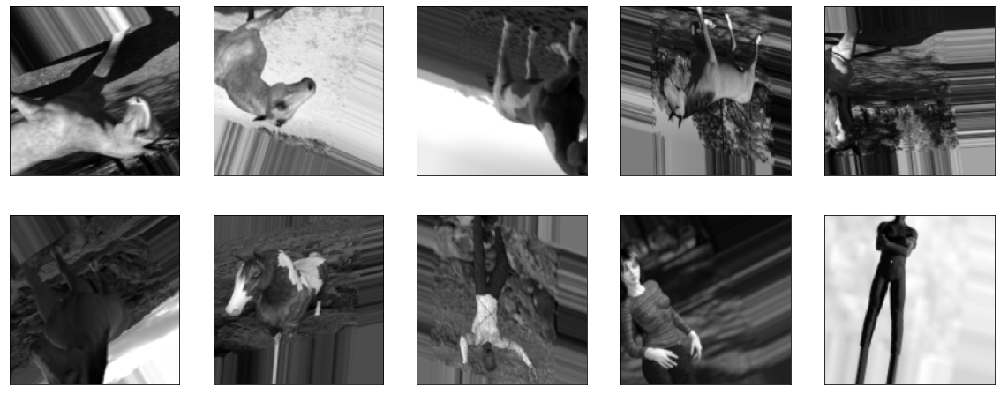

In [228]:
# santiago comentó una linea y puso otra 
#para aumento de datos en el entranamirnto
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen=ImageDataGenerator(
    rotation_range=30,   #rotar las iagenes de matera aleatiroa 50° (deformacion(?))
    width_shift_range=0.3, #mover las  imagenes a los lados
    height_shift_range=0.2, #Arriba o abajo
    shear_range=20,          #se inclina
    zoom_range=[.7,1.5],     #el tamaño oxila entre el 50% y el 150%
    vertical_flip=True,       #deformacion vertical
    horizontal_flip=True    #deformacion horizontal
    
)

datagen.fit(x)    #transforma todas la imagenes de entrenamiento

plt.figure(figsize=(20,8))
for imagen, etiqueta in datagen.flow(x,y,batch_size=10, shuffle=False):    # imprimir transformacion de las 10 primeras en orden(False)
  for i in range(10):
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.imshow(imagen[i].reshape(100,100),cmap='gray')
    plt.imshow(imagen[i].reshape(150,150),cmap='gray')
  break

*MODELOS*  
**uno denso y 2 convolucionales*









In [241]:
#MODELO DENSO
modeloDenso= tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(150,150,1)), #capa de entrada recibiendo 150*150 pixeles
  tf.keras.layers.Dense(150,activation='relu'),
  tf.keras.layers.Dense(150,activation='relu'),  #2 capas densas de 150 neuronas cada una, con activacion RELU
  tf.keras.layers.Dense(1,activation='sigmoid')
  # como solo tengo 2 opciones, caballo o humano puedo utilizar la funcion de activacion sofmax o sigmoy ya que esta ultimi oxila entre 0 y 1 justo como la lista *Y*  y puedo utilizar una sola neuromna de salida 
])

#MODELO RED NEURONAL CONBOLUCIONAL
modeloCNN=tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(150,150,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.BatchNormalization(),
    #aqui lo que hice due que cree 3 pares de capas convolucioneales y de agrupacion maxima
    #separando por 32,64 y 128 filtros

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100,activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
    #aqui lo que hice fue crear una capa densa de 150 neuronas y la salida   con sigmoid

])

#MODELO CONVOLUCIONAL PERO CON UN DOPOUR DE 0.2 Y UTILIZARE UNA CAPA DENDA
# DE 250 NEURONAS. VER LO QUE ES UN DROPOUT Y RECORDAR QUE APAGA UN PORCENTAJE DE NEURONAS (-->0.5 AQUI)
modeloCNN2=tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation='relu', input_shape=(150,150,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128,(3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.BatchNormalization(),
    #aqui lo que hice due que cree 3 pares de capas convolucioneales y de agrupacion maxima
    #paando por 32,64 y 128 filtros
    #dismunuir el dropout
    #utilizar el back normalizacion
    #aumentar capas convulucionale a 5-> 64, 128 y lugo utilizo maxpooling  y batch normalization
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250,activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
    
])


In [242]:
# con optimizador Nadam
#Compilacion para evaluar posteriornmente
modeloDenso.compile(optimizer='Adadelta',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='Adadelta',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='Adadelta',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])


#compilo los modelos con el optimizador adam, la funcion de perdida sera 
#BINARY_CROSSENTROPY porque el resultado es BINARIO (humano, caballo), y las 
#metricas de presicion

#OPTIMISADOR ADAM CONSULTAR MEJORA DEL ADAM REDUCIR OXILACION

In [243]:
from gc import callbacks

In [244]:
from tensorflow.keras.callbacks import TensorBoard  #para graficar el funcionamiento de los modelos

In [245]:

data_gen_entrenamiento=datagen.flow(x,y,batch_size=32)

In [246]:
tensorboardDenso=TensorBoard(log_dir='grafs/denso')
modeloDenso.fit(data_gen_entrenamiento,batch_size=32,#para entrenar el modelo, le mando la X que los las imagenes, Y que son las etiquetas  y le doy un tamaño de lote
                validation_data=(x_t,y_t),# las imagenes son de entrenamiento 
                steps_per_epoch=int(np.ceil(len(x)/float(32))),
                validation_steps=int(np.ceil(len(x_t)/float(32))),
                epochs=100,
                callbacks=[tensorboardDenso])

Epoch 1/100
33/33 [==============================] - 2s 60ms/step - loss: 0.6957 - accuracy: 0.5316 - val_loss: 0.7212 - val_accuracy: 0.4844
Epoch 2/100
33/33 [==============================] - 2s 55ms/step - loss: 0.6878 - accuracy: 0.5511 - val_loss: 0.7131 - val_accuracy: 0.5195
Epoch 3/100
33/33 [==============================] - 2s 55ms/step - loss: 0.6888 - accuracy: 0.5346 - val_loss: 0.7081 - val_accuracy: 0.5312
Epoch 4/100
33/33 [==============================] - 2s 57ms/step - loss: 0.6775 - accuracy: 0.5560 - val_loss: 0.6849 - val_accuracy: 0.5664
Epoch 5/100
33/33 [==============================] - 2s 56ms/step - loss: 0.6781 - accuracy: 0.5453 - val_loss: 0.6734 - val_accuracy: 0.6289
Epoch 6/100
33/33 [==============================] - 2s 57ms/step - loss: 0.6748 - accuracy: 0.5725 - val_loss: 0.6591 - val_accuracy: 0.6797
Epoch 7/100
33/33 [==============================] - 3s 84ms/step - loss: 0.6726 - accuracy: 0.5920 - val_loss: 0.6502 - val_accuracy: 0.6875
Epoch 

In [247]:
tensorboardCNN=TensorBoard(log_dir='grafs/cnn')
modeloCNN.fit(data_gen_entrenamiento,batch_size=32,#para entrenar el modelo, le mando la X que los las imagenes, Y que son las etiquetas  y le doy un tamaño de lote
                validation_data=(x_t,y_t),# las imagenes son de validacion
                steps_per_epoch=int(np.ceil(len(x)/float(32))),
                validation_steps=int(np.ceil(len(x_t)/float(32))),
                epochs=100,
                callbacks=[tensorboardCNN])

Epoch 1/100
33/33 [==============================] - 3s 73ms/step - loss: 0.8233 - accuracy: 0.5200 - val_loss: 0.6961 - val_accuracy: 0.5000
Epoch 2/100
33/33 [==============================] - 2s 67ms/step - loss: 0.7473 - accuracy: 0.5794 - val_loss: 0.7080 - val_accuracy: 0.5000
Epoch 3/100
33/33 [==============================] - 2s 67ms/step - loss: 0.7645 - accuracy: 0.5862 - val_loss: 0.7323 - val_accuracy: 0.5000
Epoch 4/100
33/33 [==============================] - 2s 65ms/step - loss: 0.7402 - accuracy: 0.5774 - val_loss: 0.7572 - val_accuracy: 0.5000
Epoch 5/100
33/33 [==============================] - 2s 69ms/step - loss: 0.6898 - accuracy: 0.6164 - val_loss: 0.7921 - val_accuracy: 0.5000
Epoch 6/100
33/33 [==============================] - 2s 68ms/step - loss: 0.6880 - accuracy: 0.6125 - val_loss: 0.7871 - val_accuracy: 0.5000
Epoch 7/100
33/33 [==============================] - 3s 91ms/step - loss: 0.7001 - accuracy: 0.6027 - val_loss: 0.7826 - val_accuracy: 0.5000
Epoch 

In [248]:
tensorboardCNN2=TensorBoard(log_dir='grafs/cnn2')
modeloCNN2.fit(data_gen_entrenamiento,batch_size=32,#para entrenar el modelo, le mando la X que los las imagenes, Y que son las etiquetas  y le doy un tamaño de lote
                validation_data=(x_t,y_t),# las imagenes son de entrenamiento 
                steps_per_epoch=int(np.ceil(len(x)/float(32))),
                validation_steps=int(np.ceil(len(x_t)/float(32))),
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
33/33 [==============================] - 3s 75ms/step - loss: 0.9525 - accuracy: 0.4499 - val_loss: 0.7073 - val_accuracy: 0.5000
Epoch 2/100
33/33 [==============================] - 2s 68ms/step - loss: 0.9519 - accuracy: 0.4450 - val_loss: 0.7343 - val_accuracy: 0.5000
Epoch 3/100
33/33 [==============================] - 2s 71ms/step - loss: 0.9223 - accuracy: 0.4722 - val_loss: 0.7601 - val_accuracy: 0.5000
Epoch 4/100
33/33 [==============================] - 2s 68ms/step - loss: 0.9186 - accuracy: 0.4684 - val_loss: 0.7830 - val_accuracy: 0.5000
Epoch 5/100
33/33 [==============================] - 3s 84ms/step - loss: 0.9135 - accuracy: 0.4596 - val_loss: 0.7956 - val_accuracy: 0.5000
Epoch 6/100
33/33 [==============================] - 2s 70ms/step - loss: 0.9113 - accuracy: 0.4615 - val_loss: 0.7959 - val_accuracy: 0.5000
Epoch 7/100
33/33 [==============================] - 2s 69ms/step - loss: 0.8990 - accuracy: 0.4781 - val_loss: 0.7900 - val_accuracy: 0.5000
Epoch 

***visualisacion de los modelos***

In [249]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [250]:
%tensorboard --logdir grafs/

Reusing TensorBoard on port 6006 (pid 6926), started 2:54:41 ago. (Use '!kill 6926' to kill it.)

<IPython.core.display.Javascript object>

segun las graficas de los modelos el mas apto es el **modelo** **denso**, pare este caso, ya que el la grafica de precicion el set de entrenamiento asciende, y el set de pruebas sufre una pequeña caida, pero asciende tambien, y en la grafica de perdida tanto el set de pruebas como el de entrenamiento, disminuyen con base el sistema avanza

In [ ]:
##AQUI GUARDO EL MODELO MATEMATICO DE LAS 3 UTILIZANDO JOBLIB--> MIRAR MODELO FENOMENOLOGICO APROX 4 LINEAS, FORMATO JLIB
##EN EL INFORME ADJUNTAR EL ENLACE DE GITHUB CON EL MODELO  MATEMATICO
dump(modeloDenso, 'Modelo_Denso.joblib')
dump(modeloCNN, 'Modelo_Convolucional.joblib')
dump(modeloCNN2, 'Modelo_Convolucional_DropOut_0.2.joblib')

['Modelo_Convolucional_DropOut_0.2.joblib']

In [ ]:
modeloDenso.save('humanos-caballos-denso.h5') #guardo el mejor modelo

In [ ]:
!pip install tensorflowjs

Validacion del modelo

In [ ]:
from sklearn.metrics import accuracy_score,confusion_matrix, precision_score, recall_score, f1_score # Métrica de la exactitud genérica
from sklearn.metrics import roc_curve, auc, RocCurveDisplay # Receiver operating characteristic (ROC) curve
from sklearn.metrics import precision_recall_curve, PrecisionRecallDisplay
from sklearn.metrics import average_precision_score

In [ ]:
#Matriz confusion
matriz_modelo = confusion_matrix(datos_entrenamiento, datos_test)
print(matriz_modelo)

NameError: ignored

In [ ]:
!mkdir carpeta_salida

In [ ]:
!tensorflowjs_converter --input_format keras humanos-caballos-denso.h5 carpeta_salida